In [1]:
from platform import python_version
print(python_version())

3.7.7


In [2]:
import pandas as pd
import json
import re
import sys
import time
import random
import pickle
from datetime import datetime,timedelta, date
sys.version

'3.7.7 (default, Apr 15 2020, 05:09:04) [MSC v.1916 64 bit (AMD64)]'

In [83]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
from collections import Counter

# Gensim
import gensim
from gensim.models.ldamodel import LdaModel
import gensim.corpora as corpora
from gensim.models import CoherenceModel
# NLTK
import nltk
from nltk.corpus import stopwords
from nltk.stem import SnowballStemmer
from nltk import word_tokenize
nltk.download( 'stopwords' )
nltk.download( 'wordnet' )



# spacy
import spacy
from spacy_spanish_lemmatizer import SpacyCustomLemmatizer
# Ploteo
import pyLDAvis

from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Facundo\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\Facundo\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [4]:
db_politicos_csv = "politicosdb.csv"
politicosdb_df = pd.read_csv(db_politicos_csv )

### Una muestra de ese DataFrame

In [5]:
politicosdb_df.sample(5)

,id,screen_name,nombre,partido,nombre_partido,orientacion,total_tweets,tweets,fecha_creado,fecha_min,descripcion,num_seguidores
84,16077528,@AlbertoBelaunde,Alberto de Belaunde 🧼,mor,partido morado,cen,5271,3794,2008-09-01,2008-08-13,Congresista de la República. Profamilias (todas).,380269
16,4191723502,@arlettecontrers,Arlette Contreras,nul,no conocido,izq,3291,3225,2015-11-15,2015-09-29,Congresista de la República del Perú 2020-2021...,14376
21,72361116,@suselparedes,Susel Paredes,nul,no conocido,izq,197166,22675,2009-09-07,2009-04-16,"Abogada, fiscalizadora, gladiadora.",88426
101,942783889,@MiguelRoman_V,Miguel Román,app,alianza para el progreso,cder,1381,1375,2012-11-12,2012-11-12,Congresista de la República del Perú (2016-20...,1240
99,627196536,@AleGarciaOviedo,Alejandra García Oviedo,ap,accion popular,cder,4875,3532,2012-07-05,2012-06-22,27 años. Regidora de Lima 2019-2022. President...,227


In [6]:
politicosdb_df[['screen_name','nombre','nombre_partido','orientacion','tweets','fecha_creado','descripcion','num_seguidores']].sample(5)
politicosdb_df[['screen_name','nombre','nombre_partido','orientacion','tweets','fecha_creado']].sample(5)

,screen_name,nombre,nombre_partido,orientacion,tweets,fecha_creado
93,@UrsulaMoscoso,Ursula Moscoso 🇵🇪,partido morado,cen,1066,2017-06-16
47,@ColumbusOpina,Diethell Columbus Murata,fuerza popular,der,6868,2015-04-01
3,@SegundoMendezA,Segundo Mendez,no conocido,izq,8504,2018-11-01
17,@anajarav,Ana Jara Velásquez 🇵🇪,partido ollanta,izq,12492,2012-01-05
79,@jorgevillenal,Jorge Villena 🇵🇪,no conocido,der,19708,2009-10-16


## POR CADA POLITICO CARGAMOS SU RESPECTIVO DataFrame CON TODOS LOS TWEETS RECUPERADOS

In [6]:
def cargaTweetsDB(df_users):
    userstweets_dict = {}
    for idx,scr_name in enumerate(df_users['screen_name']):   
        usuario_df = pd.read_csv("tweetsdb_"+scr_name+".csv" )
        usuario_df.fillna('', inplace=True)
        userstweets_dict[scr_name[1:]]=usuario_df.copy()        
    return userstweets_dict
    
politicosdf_dict=cargaTweetsDB(politicosdb_df)

politicodf_list = []
for politico in politicosdf_dict.keys():
    politicodf_list.append(politicosdf_dict[politico])


## CARGAMOS LISTA DE TWEETS **POR PARTIDO**

In [156]:
partidos_tweets_df_dict = {}  #diccionario con dataframes de tweets por partido
partidosdf_dict = {} 
conjunto_partidos=set(politicosdb_df['partido'])
print("Paridos encontrados:")
for partido in conjunto_partidos:
    tweets_df = pd.read_csv(f"tweets-partido-db_{partido}.csv" )
    tweets_df.fillna('', inplace=True)
    partidos_tweets_df_dict[partido]=tweets_df.copy()
    partidos_tweets_df_dict[f"{partido}_len"]=len(tweets_df)
    partidosdf_dict[partido]=politicosdb_df.loc[politicosdb_df['partido'] == partido]
    print(f" {partido}" ,end="")
print("\nCompletada la carga.")

Paridos encontrados:
 ppc pnp fa mil psn per mor pr fp apra app upp pp ppk PPP np nul ap
Completada la carga.


### Ejemplo: **(por partido)**: Tweets de "Accion Popular" = **'AP'**

In [12]:
partidos_tweets_df_dict['ap']

,id,User,Text,Date,Retweets,Mentions,HashTags,text_prep
0,1276238617019658240,JorgeMunozAP,La Municipalidad Metropolitana de Lima y el Mi...,2020-6-25,0,,,municipalidad metropolitana lima ministerio pr...
1,1276237796685029377,JorgeMunozAP,"Hoy hicimos una visita a Mesa Redonda, con el ...",2020-6-25,0,,,hicimos visita mesa redonda ministro defensa w...
2,1275995792021622785,JorgeMunozAP,"Con voluntad de mejoras, continuamos trabajand...",2020-6-25,4,,,voluntad mejoras continuamos trabajando seguir...
3,1275995790100529152,JorgeMunozAP,"Hoy estuvimos en San Juan de Miraflores, verif...",2020-6-25,4,,#COVID19,juan miraflores verificando trabajo comerciant...
4,1275956058603900928,JorgeMunozAP,"Vecinos, el confinamiento social nos pone gran...",2020-6-25,25,,#RetoLima95,vecinos confinamiento social pone grandes reto...
...,...,...,...,...,...,...,...,...
18985,221034902399881216,AleGarciaOviedo,"@Andreagomez_re todas las chiquis, babe. Adela...",2012-07-06,0,@Andreagomez_re,,todas chiquis babe adelantamos amigo
18986,221034415214702593,AleGarciaOviedo,@Andreagomez_re. Mañana mañana. El cuerpo pide...,2012-07-06,0,@Andreagomez_re,,mañana mañana cuerpo pide mañana
18987,221034175048847360,AleGarciaOviedo,"No hay ningun hecho relevante en la tele, exce...",2012-07-06,0,,,ningun hecho relevante tele excepto cantantes ...
18988,221033606905217025,AleGarciaOviedo,@Andreagomez_re. Yo tambien quiero arta terapi...,2012-07-06,0,@Andreagomez_re,,tambien quiero arta terapiaaaaaa


## Mostramos el numero de tweets por partido
#### **nul** significa que no tienen afiliacion a un partido (p.ej.periodistas, escritores), a pesar de eso pueden tener una preferencia política (**orientación**)

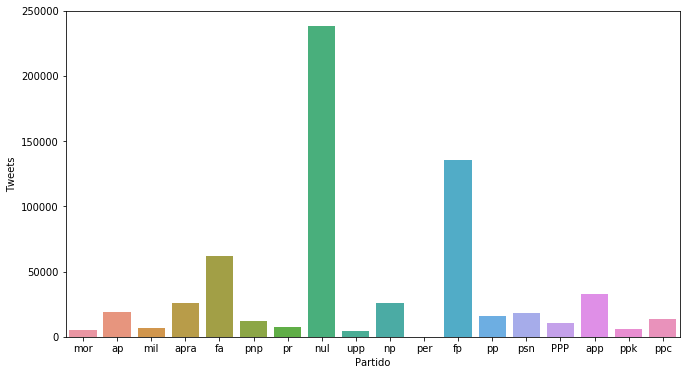

In [18]:
lst = []
for partido in conjunto_partidos:    
    df=partidosdf_dict[partido]
    nombre_partido = df.nombre_partido.iloc[0]
    _tweets = partidos_tweets_df_dict[f"{partido}_len"]
    lst.append( (partido,_tweets,nombre_partido ) )
    
df1 = pd.DataFrame(lst, columns =['Partido', 'Tweets', 'Nombre partido'])
plt.figure(figsize=(11,6))
sns.barplot(x="Partido", y="Tweets", data=df1)


## CARGAMOS LISTA DE TWEETS **POR ORIENTACION**

In [6]:
orientacion_tweets_df_dict = {}  #diccionario con dataframes de tweets por orientacion
orientaciondf_dict = {}
conjunto_orientacion=set(politicosdb_df['orientacion'])
print("Cargando Orientaciones:")
for orientacion in conjunto_orientacion:    
    tweets_df = pd.read_csv(f"tweets-orientacion-db_{orientacion}.csv" )
    tweets_df.fillna('', inplace=True)
    tweets_df['orientacion']=orientacion
    orientacion_tweets_df_dict[orientacion]=tweets_df.copy() 
    orientacion_tweets_df_dict[f"{orientacion}_len"]=len(tweets_df)
    orientaciondf_dict[orientacion]=politicosdb_df.loc[politicosdb_df['orientacion'] == orientacion] 
    print(f" {orientacion}" ,end="")
print("\nCompletada la carga.")

Cargando Orientaciones:
 cen cder izq cizq der nul
Completada la carga.


### Ejemplo: **(por orientacion)**: Tweets de Centro-Derecha

In [137]:
orientacion_tweets_df_dict['cder']

,id,User,Text,Date,Retweets,Mentions,HashTags,text_prep,Orientacion
0,1276334711372161025,MaricarmenAlvaP,Finalmente se aprobó la paridad y alternancia....,2020-6-26,1,,,finalmente aprobo paridad alternancia luego añ...,cder
1,1276333834905227272,MaricarmenAlvaP,RT @ApBancada: 🔊 Acción Popular es un partido ...,2020-6-26,3,@ApBancada,,accion popular partido democratico conviccion ...,cder
2,1276333818484527105,MaricarmenAlvaP,RT @ApBancada: En #AcciónPopular siempre apost...,2020-6-26,2,@ApBancada,#AcciónPopular,siempre apostaremos igualdad oportunidades ell...,cder
3,1275974282577936385,MaricarmenAlvaP,Hoy celebramos el Día del Campesino dándole gr...,2020-6-25,0,,#Adelante,celebramos campesino dandole gracias grandes h...,cder
4,1275974194484973573,MaricarmenAlvaP,"RT @ApBancada: 🚨Pronunciamiento del vocero, @O...",2020-6-25,17,@ApBancada @OttoGuibovich,#BancadaAP,pronunciamiento vocero falsas acusaciones blin...,cder
...,...,...,...,...,...,...,...,...,...
26504,268362089486241792,MiguelRoman_V,"Buen dìa, en la I.E. San Francisco de Asís. Pr...",2012-11-13,0,,,buen francisco asis programa alcalde inculcand...,cder
26505,268216720903270401,MiguelRoman_V,"Buenas noches a todos, a descansar bien, para ...",2012-11-13,0,,,buenas noches descansar bien mañana seguir ade...,cder
26506,268168443788931072,MiguelRoman_V,Hoy lunes compartimos un grato momento con los...,2012-11-13,0,,,lunes compartimos grato momento vecinos alto v...,cder
26507,268086593678635008,MiguelRoman_V,Seguiremos apoyando a los pescadores artesanal...,2012-11-12,0,,,seguiremos apoyando pescadores artesanales ext...,cder


## Creamos lista de #Hastags y @Mentions por partido y por orientacion

In [182]:
#preprocesamiento basico para mentciones y hashtags
def simple_pre_proc(text):    
    text = re.sub(r"[ùúûü]","u", text)
    text = re.sub(r"[òóôõö]","o", text) 
    text = re.sub(r"[ìíîï]","i", text) 
    text = re.sub(r"[èéêë]","e", text)
    text = re.sub(r"[àáâãäå]","a", text) 
    return text.lower()


In [183]:
orientacion_hashtags_dict = {}
orientacion_mentions_dict = {}
for orientacion in conjunto_orientacion:
    orientacion_hashtags_dict[orientacion]=[simple_pre_proc(palabra) for palabra in ' '.join(orientacion_tweets_df_dict[orientacion].HashTags).split()]
    orientacion_mentions_dict[orientacion]=[simple_pre_proc(palabra)  for palabra in ' '.join(orientacion_tweets_df_dict[orientacion].Mentions).split()]
    
partidos_hashtags_dict = {}
partidos_mentions_dict = {}
for partido in conjunto_partidos:
    partidos_hashtags_dict[partido]=[simple_pre_proc(palabra)  for palabra in ' '.join(partidos_tweets_df_dict[partido].HashTags).split()]
    partidos_mentions_dict[partido]=[simple_pre_proc(palabra)  for palabra in ' '.join(partidos_tweets_df_dict[partido].Mentions).split()]

## Mostramos el número de tweets por orientacion 

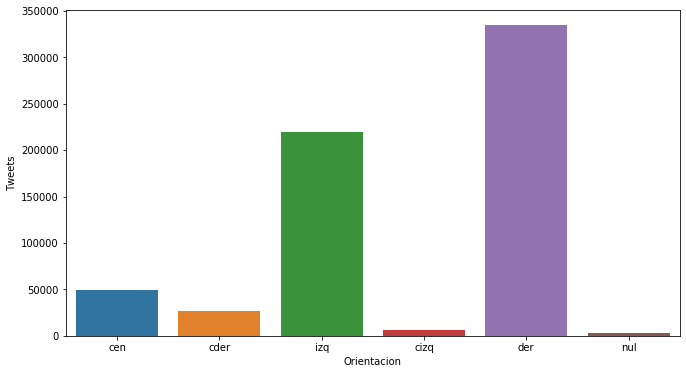

In [8]:
lst = []
for orientacion in conjunto_orientacion:  
    _tweets = orientacion_tweets_df_dict[f"{orientacion}_len"]
    df2 = pd.DataFrame(lst, columns =['Orientacion', 'Tweets'])
    lst.append( (orientacion,_tweets) )
    
df1 = pd.DataFrame(lst, columns =['Orientacion', 'Tweets'])
plt.figure(figsize=(11,6))
sns.barplot(x="Orientacion", y="Tweets", data=df1)

## CREA DATAFRAME CON  TODOS LOS TWEETS PREPROCESADOS ANOTADOS POR PARTIDO Y ORIENTACION

In [218]:
%%time
lst = [value for (key,value) in orientacion_tweets_df_dict.items() if key[-3:] != 'len']
dict_u={}
for u in politicosdb_df.screen_name:
    dict_u[u[1:]]=politicosdb_df.partido.loc[politicosdb_df.screen_name==u].iloc[0]
all_tweets_df = pd.concat(lst).drop( columns=['id','Text','Retweets','Mentions','HashTags'])
all_tweets_df['partido']=all_tweets_df.User.apply(lambda u:dict_u[u])
all_tweets_df.drop( columns=['User'],inplace=True)
all_tweets_df.to_csv("all_tweets_db.csv",index=False)
all_tweets_df['text_tok']=all_tweets_df.text_prep.apply(lambda txt:txt.split())
all_tweets_df.sample(10)

Wall time: 4.51 s


,Date,text_prep,Orientacion,partido,text_tok
305595,2020-5-18,recibio millones presupuesto comprometio gasta...,der,nul,"[recibio, millones, presupuesto, comprometio, ..."
213622,2017-10-29,diferencias trabajar sindicato sindicato,der,nul,"[diferencias, trabajar, sindicato, sindicato]"
14492,2012-07-25,parecer tendre leerme toda corde eclessiae est...,cder,ap,"[parecer, tendre, leerme, toda, corde, eclessi..."
247359,2020-3-25,peruano roberto chang chileno escriben debe re...,der,fp,"[peruano, roberto, chang, chileno, escriben, d..."
205287,2018-08-27,,der,nul,[]
281524,2019-12-4,felicitaciones doctor decano ilustre colegio a...,der,fp,"[felicitaciones, doctor, decano, ilustre, cole..."
128259,2015-12-23,excelente pregunta tambien notorio desafio,der,app,"[excelente, pregunta, tambien, notorio, desafio]"
126055,2017-08-31,acatara fallo duda desorden atomizacion politi...,der,app,"[acatara, fallo, duda, desorden, atomizacion, ..."
81556,2012-08-11,atenciones medicas poli pagada yanacocha hizo ...,izq,fa,"[atenciones, medicas, poli, pagada, yanacocha,..."
11171,2020-01-03,nica,izq,nul,[nica]


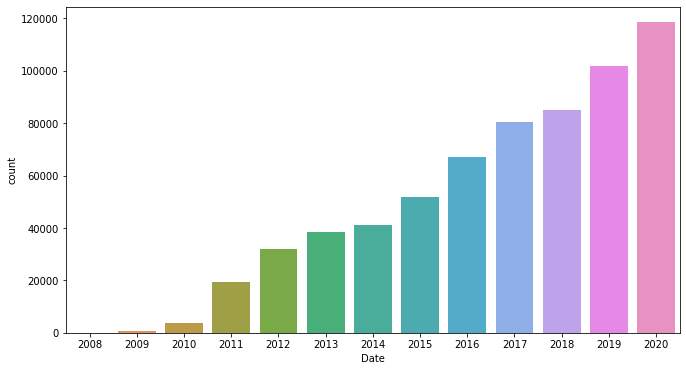

In [19]:
plt.figure(figsize=(11,6))
sns.countplot(all_tweets_df.Date.str[0:4])

## Muestra WORDCLOUDs según orientacion

In [187]:
def muestra_wordcloud(text):
    wordcloud = WordCloud( max_words=100,background_color="white",collocations = False).generate(text)
    # Display the generated image:
    plt.figure(figsize=(10,7))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.show()

Orientacion:  cen


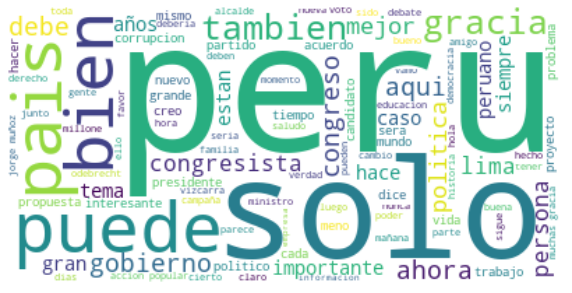

Orientacion:  cder


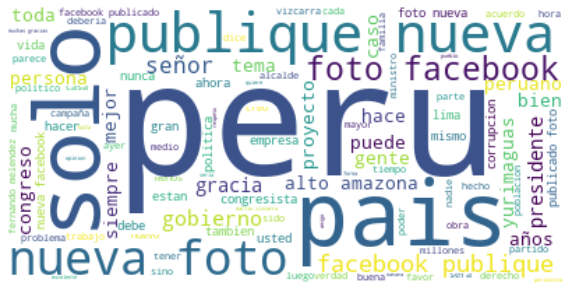

Orientacion:  izq


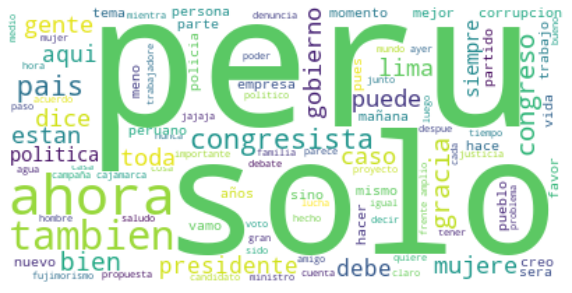

Orientacion:  cizq


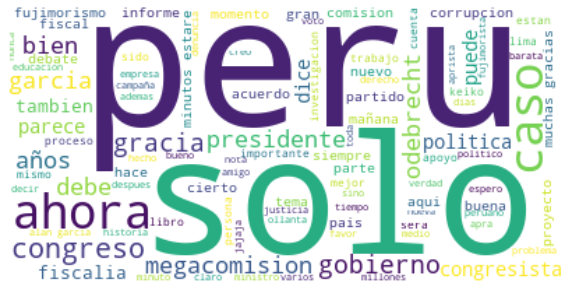

Orientacion:  der


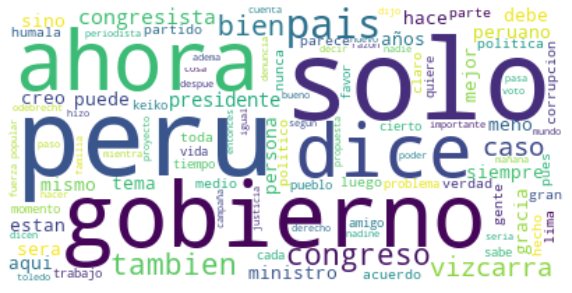

Orientacion:  nul


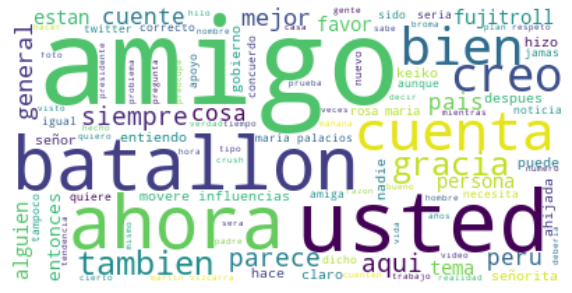

In [16]:
for orientacion in conjunto_orientacion: 
    text = ' '.join(orientacion_tweets_df_dict[orientacion].text_prep)
    print("Orientacion: ",orientacion)
    muestra_wordcloud(text)

In [43]:
#filtrar retweets
all_tweets_df_noRT=all_tweets_df.loc[all_tweets_df.Text.str[0:2]!="RT"]
del all_tweets_df_noRT

In [33]:
for orientacion in conjunto_orientacion: 
    text = ' '.join(orientacion_tweets_df_dict[orientacion].text_prep)
    print("Orientacion: ",orientacion)
    c_tokens = Counter(text.split()) 
    print(len(c_tokens))
    print(c_tokens.most_common(25))
    print()

Orientacion:  cen
44401
[('', 3091), ('peru', 2722), ('gracias', 1885), ('solo', 1523), ('lima', 1415), ('congreso', 1230), ('años', 1168), ('puede', 1135), ('gobierno', 1111), ('politica', 1110), ('toledo', 1078), ('pais', 1062), ('bien', 1055), ('hace', 1051), ('debe', 1033), ('mejor', 1023), ('tambien', 987), ('presidente', 979), ('aqui', 958), ('ahora', 933), ('gran', 880), ('justicia', 741), ('hacer', 688), ('fiscal', 683), ('trabajo', 672)]

Orientacion:  cder
34716
[('facebook', 1343), ('pais', 1308), ('nueva', 1287), ('foto', 1218), ('señor', 1161), ('peru', 1087), ('gracias', 947), ('solo', 907), ('publique', 834), ('presidente', 802), ('gobierno', 761), ('yurimaguas', 754), ('congreso', 732), ('loreto', 632), ('años', 626), ('', 569), ('alto', 563), ('hace', 547), ('vizcarra', 487), ('amazonas', 467), ('puede', 462), ('gente', 453), ('mejor', 441), ('trabajo', 433), ('politica', 432)]

Orientacion:  izq
100251
[('', 11411), ('peru', 8693), ('solo', 5969), ('ahora', 5838), ('c

In [49]:
def remove_common(text,common_words):
    #removemos stopwords
    text = text.split()
    important_words=[]
    for word in text:
        if word not in common_words:
            important_words.append(word)
            
    return  ' '.join(important_words)

## WordCloud **por orientacion** removiendo las palabras mas comunes

In [190]:
#palabras comunes en politica y comunes en general
common_words = ['peru','gracias','solo','congreso', 'años','puede','gobierno','politica','estan','siempre','foto','nueva','hola','pais','debe',
                'hace','facebook','publique','ahora','estare','bien','tambien','cuenta', 'usted','creo','aqui','dice','gran','estan','vizcarra'
                'congresista','congresistas','peruano','mejor','toda','todo','buen','bueno','sera','cada','presidente','nadie','hacer','hilo','sino','mismo',
                'partido','caso','accion popular','keiko','apra','aprista','video lista','patria','roja','fuerza','popular','menos','lima']

Orientacion:  cen 
Tokens original: 44400
Tokens para el wordcloud: 44347
Tokens mas comunes: [('toledo', 1078), ('justicia', 741), ('fiscal', 683), ('trabajo', 672), ('corrupcion', 625), ('personas', 601), ('vizcarra', 578), ('accion', 556), ('importante', 550), ('millones', 550), ('salud', 548), ('buena', 544), ('educacion', 539), ('dias', 532), ('muchas', 532), ('nacional', 530), ('poder', 528), ('favor', 518), ('jorge', 518), ('ministro', 515), ('tiempo', 514), ('alcalde', 513), ('nuevo', 504), ('muñoz', 498), ('mundo', 496)]


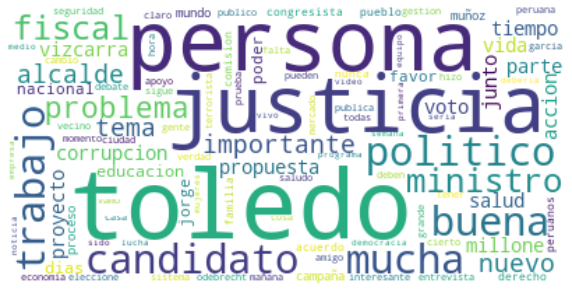

Orientacion:  cder 
Tokens original: 34715
Tokens para el wordcloud: 34662
Tokens mas comunes: [('señor', 1161), ('yurimaguas', 754), ('loreto', 632), ('alto', 563), ('vizcarra', 487), ('amazonas', 467), ('gente', 453), ('trabajo', 433), ('publicado', 415), ('excelente', 408), ('nacional', 400), ('proyecto', 378), ('tema', 371), ('salud', 370), ('poder', 358), ('comision', 352), ('muchas', 350), ('corrupcion', 349), ('peruanos', 344), ('acuerdo', 342), ('martin', 340), ('vida', 337), ('ministro', 332), ('regional', 320), ('nuevo', 316)]


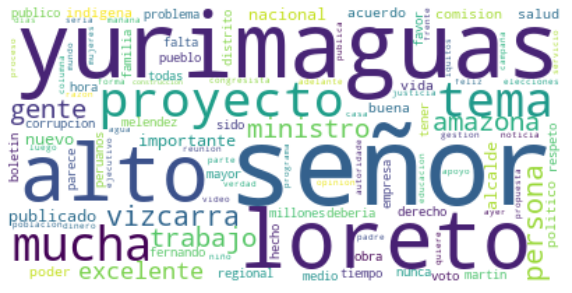

Orientacion:  izq 
Tokens original: 100250
Tokens para el wordcloud: 100197
Tokens mas comunes: [('mujeres', 4992), ('comision', 3741), ('corrupcion', 3545), ('justicia', 3461), ('derechos', 3360), ('congresista', 3295), ('violencia', 3056), ('frente', 2959), ('nacional', 2934), ('vida', 2904), ('trabajo', 2874), ('gente', 2804), ('salud', 2752), ('vivo', 2713), ('nuevo', 2707), ('personas', 2548), ('lucha', 2502), ('trabajadores', 2401), ('mujer', 2387), ('mañana', 2374), ('dias', 2371), ('pueblo', 2349), ('vamos', 2330), ('todas', 2269), ('poder', 2268)]


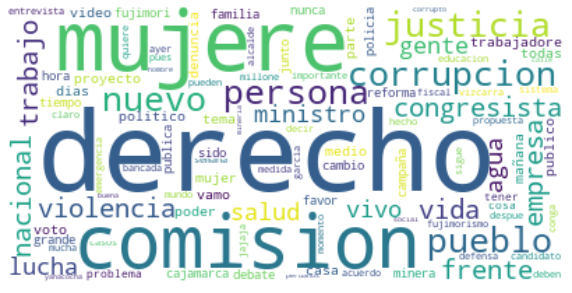

Orientacion:  cizq 
Tokens original: 12674
Tokens para el wordcloud: 12621
Tokens mas comunes: [('garcia', 198), ('comision', 150), ('odebrecht', 136), ('megacomision', 133), ('minutos', 131), ('fiscal', 114), ('muchas', 110), ('feliz', 109), ('corrupcion', 108), ('nacional', 103), ('parece', 102), ('fujimorismo', 98), ('fujimori', 97), ('acuerdo', 96), ('fiscalia', 93), ('mañana', 88), ('alan', 88), ('radio', 88), ('articulo', 83), ('buena', 83), ('educacion', 81), ('dias', 79), ('libro', 75), ('sido', 73), ('cierto', 73)]


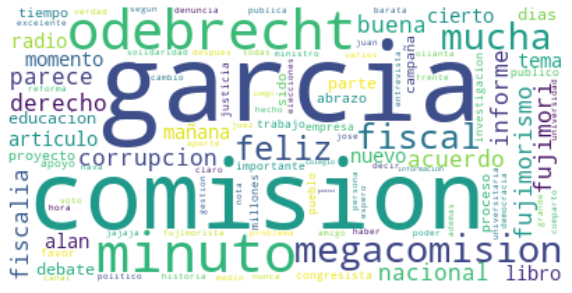

Orientacion:  der 
Tokens original: 106638
Tokens para el wordcloud: 106585
Tokens mas comunes: [('vizcarra', 9537), ('comision', 6493), ('ministro', 6340), ('humala', 5671), ('corrupcion', 5495), ('millones', 5442), ('salud', 5155), ('fiscal', 5028), ('justicia', 4963), ('poder', 4913), ('trabajo', 4702), ('fujimori', 4400), ('nadine', 4395), ('odebrecht', 4326), ('congresista', 4228), ('peruanos', 4178), ('nacional', 4138), ('gente', 3969), ('vida', 3967), ('verdad', 3902), ('nunca', 3757), ('entrevista', 3678), ('pueblo', 3628), ('dias', 3604), ('toledo', 3582)]


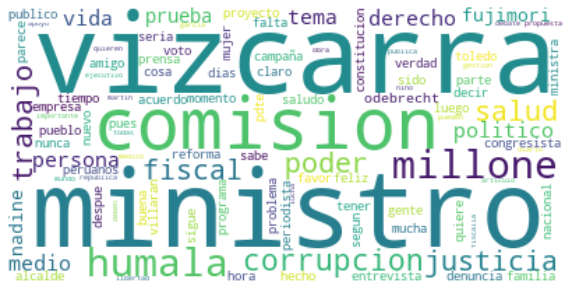

Orientacion:  nul 
Tokens original: 6049
Tokens para el wordcloud: 5997
Tokens mas comunes: [('amigo', 184), ('general', 148), ('amigos', 129), ('batallon', 128), ('cuente', 101), ('parece', 87), ('influencias', 85), ('apoyo', 64), ('alguien', 62), ('favor', 61), ('claro', 59), ('entonces', 56), ('movere', 55), ('tema', 55), ('señorita', 52), ('despues', 51), ('ahijada', 51), ('vizcarra', 50), ('hizo', 49), ('señor', 48), ('maria', 48), ('fujitroll', 47), ('entiendo', 45), ('rosa', 45), ('necesita', 45)]


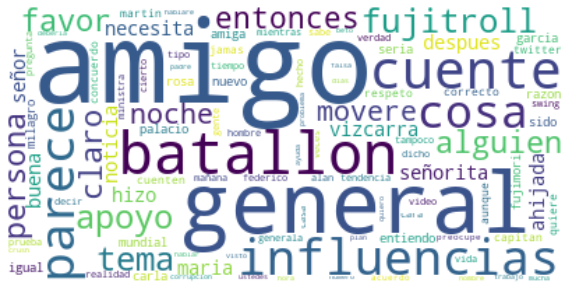

In [191]:
%%time
year_list = list(all_tweets_df.Date.str[0:4].unique())
year_list.sort()
year_tweets_df_dict = {}
for year in year_list:
    df_tmp=all_tweets_df.loc[all_tweets_df.Date.str[0:4]==year]
    #year_tweets_df_dict[year]=df.copy()
    print("Año:",year)
    muestra_wordcloud(remove_common(' '.join(df_tmp.text_prep),common_words))
    
for orientacion in conjunto_orientacion: 
    df_orientacion=orientacion_tweets_df_dict[orientacion]
    text = ' '.join(df_orientacion.text_prep)
    c_tokens = Counter(text.split()) 
    print("Orientacion: ",orientacion,"\nTokens original:",len(c_tokens))
    text = remove_common(text,common_words)
    c_tokens = Counter(text.split()) 
    print("Tokens para el wordcloud:",len(c_tokens))
    print("Tokens mas comunes:",c_tokens.most_common(25))
    muestra_wordcloud(text)
    
    

## Word Cloud **por partido**, removiendo las palabras mas comunes

Partido:  ppc (partido popular cristiano)
Tokens original: 21841
Tokens para el wordcloud: 21791
Tokens mas comunes: [('', 508), ('ministro', 460), ('gente', 386), ('lima', 382), ('vizcarra', 364), ('ejecutivo', 351), ('peruanos', 342), ('corrupcion', 338), ('salud', 327), ('verdad', 320), ('todas', 309), ('pueblo', 305), ('tmbn', 299), ('poder', 281), ('claro', 275), ('tiempo', 273), ('poblacion', 268), ('dios', 266), ('justicia', 256), ('vida', 253), ('dias', 241), ('ministra', 240), ('ministros', 230), ('verguenza', 227), ('deben', 222)]


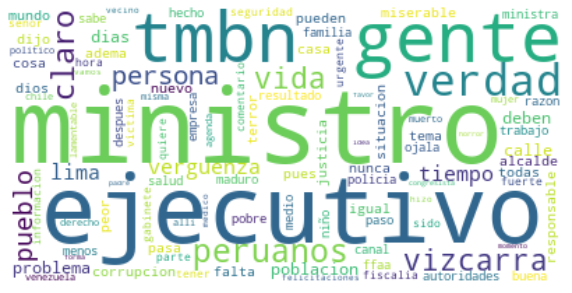

Partido:  pnp (partido ollanta)
Tokens original: 22971
Tokens para el wordcloud: 22920
Tokens mas comunes: [('', 817), ('mujer', 512), ('saludos', 499), ('pdte', 428), ('violencia', 419), ('dios', 378), ('vida', 323), ('personas', 257), ('trabajo', 256), ('mujeres', 250), ('salud', 235), ('señor', 226), ('casos', 222), ('nacional', 202), ('justicia', 200), ('lima', 193), ('familia', 193), ('atencion', 190), ('tema', 189), ('dias', 182), ('ministros', 181), ('ayer', 181), ('favor', 179), ('ministro', 174), ('muerte', 174)]


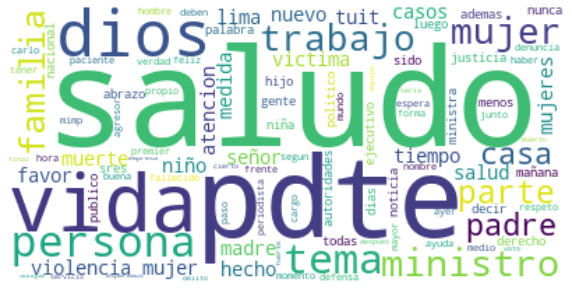

Partido:  fa (frente amplio)
Tokens original: 49744
Tokens para el wordcloud: 49693
Tokens mas comunes: [('corrupcion', 2188), ('comision', 1981), ('cajamarca', 1928), ('frente', 1747), ('agua', 1744), ('conga', 1608), ('lima', 1530), ('justicia', 1516), ('congresista', 1505), ('derechos', 1490), ('yanacocha', 1471), ('lucha', 1360), ('mineria', 1354), ('nacional', 1350), ('pueblo', 1225), ('trabajadores', 1211), ('', 1179), ('salud', 1165), ('mujeres', 1136), ('amplio', 1078), ('minera', 1032), ('empresas', 1013), ('poder', 975), ('proyecto', 938), ('trabajo', 921)]


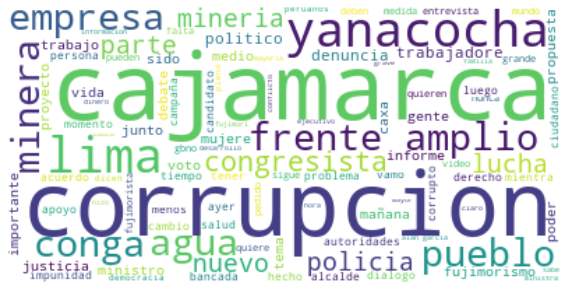

Partido:  mil (militar)
Tokens original: 17194
Tokens para el wordcloud: 17145
Tokens mas comunes: [('terrorismo', 272), ('corrupcion', 236), ('terroristas', 222), ('ffaa', 174), ('politicos', 162), ('nunca', 154), ('deben', 153), ('mundo', 153), ('cierto', 152), ('poder', 143), ('justicia', 134), ('buena', 133), ('pueden', 127), ('millones', 127), ('democracia', 126), ('tiempo', 122), ('venezuela', 120), ('terrorista', 117), ('chile', 117), ('seguridad', 116), ('problema', 115), ('vida', 114), ('politico', 114), ('ello', 111), ('deberia', 111)]


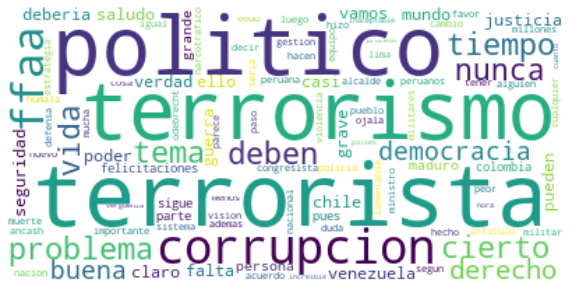

Partido:  psn (solidaridad nacional)
Tokens original: 28645
Tokens para el wordcloud: 28594
Tokens mas comunes: [('vizcarra', 914), ('odebrecht', 530), ('', 495), ('ministro', 461), ('millones', 447), ('nadine', 357), ('lima', 350), ('venezuela', 316), ('vida', 299), ('derecho', 295), ('razon', 291), ('salud', 288), ('acuerdo', 286), ('humala', 276), ('maduro', 275), ('peruanos', 273), ('menos', 269), ('trabajo', 269), ('nacional', 262), ('tema', 262), ('deben', 253), ('corrupcion', 252), ('articulo', 246), ('nuevo', 245), ('niños', 242)]


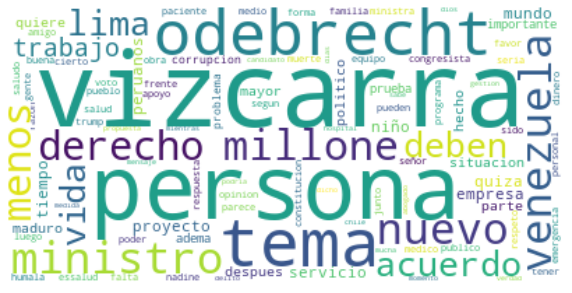

Partido:  per (periodista)
Tokens original: 469
Tokens para el wordcloud: 454
Tokens mas comunes: [('lima', 7), ('eielson', 6), ('museo', 6), ('coleccion', 4), ('world', 3), ('jorge', 3), ('farid', 3), ('ultimo', 3), ('artista', 3), ('argentino', 3), ('garcia', 3), ('pedidos', 2), ('sabado', 2), ('ayudar', 2), ('sido', 2), ('paises', 2), ('lavado', 2), ('abrazo', 2), ('fuerte', 2), ('equipo', 2), ('china', 2), ('maria', 2), ('editorial', 2), ('comercio', 2), ('paola', 2)]


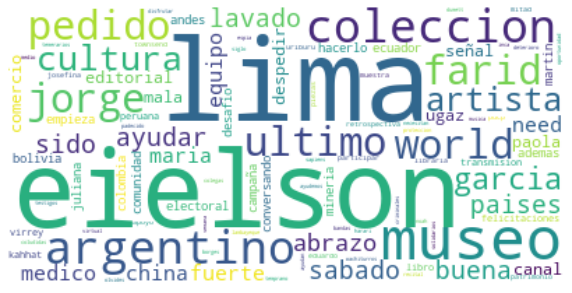

Partido:  mor (partido morado)
Tokens original: 11625
Tokens para el wordcloud: 11574
Tokens mas comunes: [('', 167), ('comision', 160), ('personas', 139), ('proyecto', 131), ('salud', 124), ('importante', 118), ('congresista', 109), ('trabajo', 106), ('mujeres', 91), ('muchas', 90), ('favor', 85), ('apoyo', 84), ('tema', 82), ('derechos', 80), ('gente', 79), ('bancada', 79), ('lucha', 77), ('violencia', 77), ('nuevo', 75), ('justicia', 74), ('voto', 73), ('dias', 73), ('pueden', 73), ('reforma', 69), ('familia', 68)]


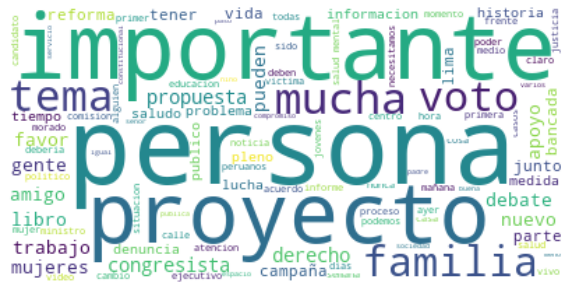

Partido:  pr (patraia roja)
Tokens original: 14552
Tokens para el wordcloud: 14502
Tokens mas comunes: [('', 333), ('comunista', 325), ('salud', 303), ('izquierda', 252), ('crisis', 239), ('pueblo', 234), ('trabajadores', 230), ('nacional', 220), ('lucha', 194), ('educacion', 189), ('frente', 188), ('millones', 175), ('lima', 171), ('derecha', 169), ('gente', 168), ('fujimori', 165), ('china', 164), ('mundo', 162), ('vida', 161), ('vamos', 147), ('corrupcion', 147), ('juntos', 143), ('pandemia', 137), ('eeuu', 132), ('derechos', 131)]


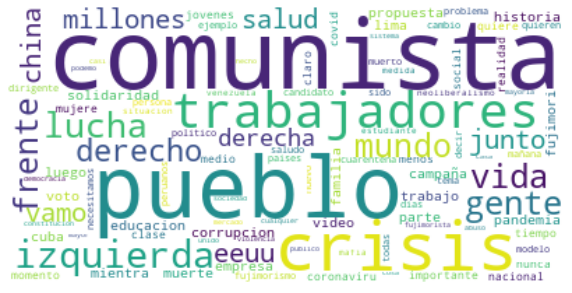

Partido:  fp (fuerza popular)
Tokens original: 68751
Tokens para el wordcloud: 68700
Tokens mas comunes: [('comision', 4519), ('', 4141), ('vizcarra', 3255), ('salud', 2995), ('congresista', 2654), ('fujimori', 2619), ('trabajo', 2601), ('corrupcion', 2546), ('justicia', 2519), ('nadine', 2513), ('fiscal', 2503), ('ministro', 2493), ('pdte', 2140), ('millones', 2117), ('nacional', 2077), ('odebrecht', 2052), ('sesion', 2003), ('constitucion', 1949), ('humala', 1949), ('toledo', 1911), ('poder', 1900), ('feliz', 1887), ('vida', 1824), ('peruanos', 1820), ('parte', 1573)]


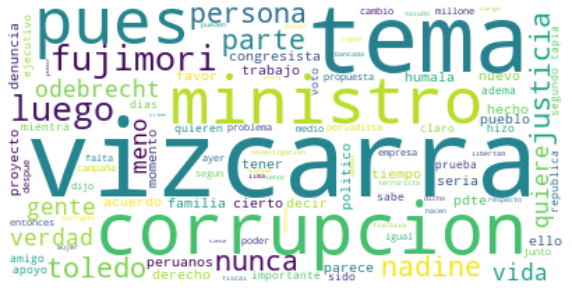

Partido:  apra (apra)
Tokens original: 27508
Tokens para el wordcloud: 27457
Tokens mas comunes: [('', 1183), ('vizcarra', 1031), ('entrevista', 872), ('alan', 861), ('millones', 816), ('programa', 705), ('garcia', 637), ('pueblo', 539), ('humala', 509), ('nota', 491), ('traves', 464), ('canal', 437), ('ministro', 435), ('nacional', 427), ('lima', 392), ('diario', 361), ('nunca', 356), ('comision', 348), ('justicia', 339), ('articulo', 336), ('fiscal', 330), ('peruanos', 325), ('corrupcion', 317), ('aprismo', 313), ('alianza', 307)]


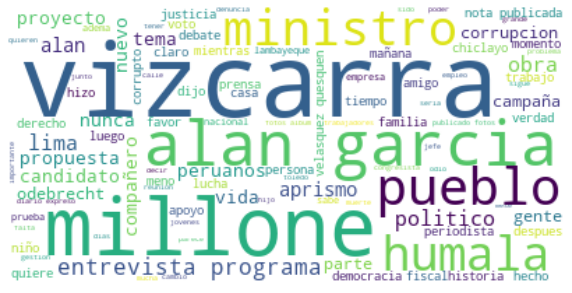

Partido:  app (alianza para el progreso)
Tokens original: 33289
Tokens para el wordcloud: 33238
Tokens mas comunes: [('humala', 945), ('yurimaguas', 753), ('juan', 742), ('ministro', 667), ('comision', 659), ('lima', 637), ('loreto', 630), ('alto', 611), ('vizcarra', 603), ('entrevista', 599), ('garcia', 545), ('nacional', 541), ('pastor', 520), ('', 518), ('sheput', 515), ('mate', 507), ('trabajo', 497), ('amazonas', 479), ('nuevo', 466), ('corrupcion', 449), ('publicado', 430), ('proyecto', 424), ('columna', 421), ('video', 420), ('debate', 413)]


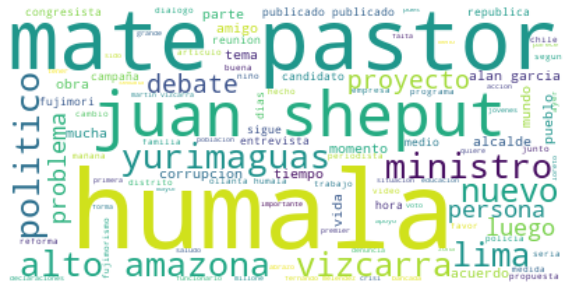

Partido:  upp (union por el peru)
Tokens original: 8315
Tokens para el wordcloud: 8266
Tokens mas comunes: [('', 412), ('ministro', 376), ('video', 287), ('comision', 237), ('justicia', 195), ('lista', 155), ('nacional', 153), ('añadido', 147), ('reproduccion', 147), ('educacion', 141), ('derechos', 138), ('sesion', 127), ('trabajo', 126), ('humanos', 123), ('universidades', 121), ('pleno', 120), ('reforma', 120), ('zeballos', 118), ('reunion', 111), ('vicente', 108), ('titular', 100), ('fecha', 99), ('congresista', 94), ('nota', 94), ('intervencion', 83)]


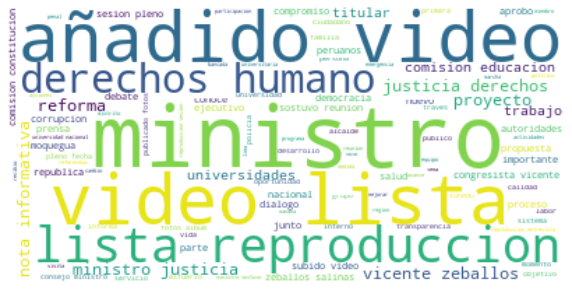

Partido:  pp (podemos peru)
Tokens original: 19442
Tokens para el wordcloud: 19391
Tokens mas comunes: [('', 1359), ('urresti', 742), ('olivos', 430), ('fiscal', 408), ('alan', 355), ('verdad', 282), ('lima', 262), ('daniel', 261), ('pruebas', 252), ('trabajo', 219), ('gente', 215), ('despues', 213), ('seguridad', 211), ('delincuentes', 207), ('vecinos', 200), ('nunca', 197), ('alguien', 191), ('alcalde', 183), ('quiere', 181), ('favor', 180), ('cierto', 179), ('juicio', 178), ('corrupcion', 177), ('vida', 176), ('sabe', 175)]


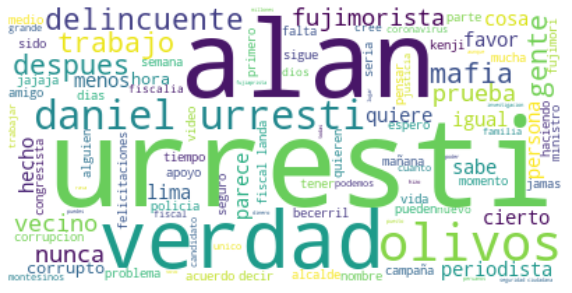

Partido:  ppk (peruanos por el kambio)
Tokens original: 12419
Tokens para el wordcloud: 12368
Tokens mas comunes: [('comision', 184), ('peruanos', 157), ('trabajo', 152), ('reforma', 133), ('millones', 131), ('justicia', 127), ('vizcarra', 123), ('', 116), ('parlamento', 116), ('corrupcion', 111), ('democracia', 109), ('nuevo', 104), ('agua', 104), ('mundo', 101), ('ministro', 98), ('ejecutivo', 98), ('nacional', 97), ('debate', 96), ('violeta', 95), ('congresista', 94), ('sistema', 93), ('proyecto', 89), ('vamos', 89), ('economia', 88), ('pueblo', 88)]


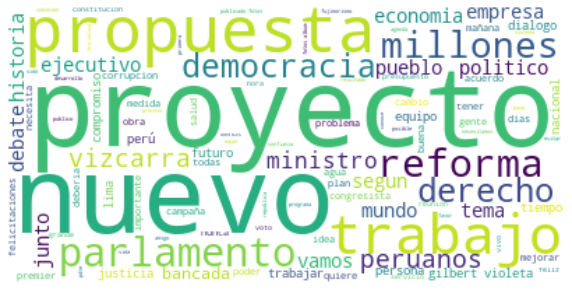

Partido:  PPP (peru posible)
Tokens original: 15283
Tokens para el wordcloud: 15232
Tokens mas comunes: [('', 1208), ('toledo', 986), ('fiscal', 449), ('justicia', 406), ('maiman', 317), ('reconoce', 274), ('persecución', 256), ('proceso', 254), ('ecoteva', 249), ('perú', 245), ('política', 238), ('debido', 234), ('guillen', 224), ('avelino', 220), ('prestigioso', 216), ('pueblo', 193), ('dueño', 170), ('peruana', 168), ('judicial', 145), ('defensa', 137), ('eeuu', 137), ('hizo', 136), ('mafia', 135), ('favor', 135), ('violaciones', 133)]


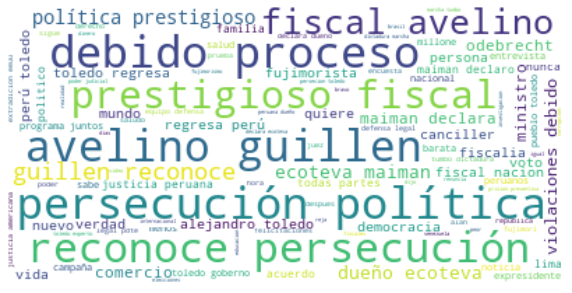

Partido:  np (nuevo peru)
Tokens original: 28586
Tokens para el wordcloud: 28535
Tokens mas comunes: [('lima', 1189), ('mujeres', 856), ('', 844), ('congresista', 798), ('comision', 761), ('corrupcion', 641), ('trabajadores', 639), ('video', 609), ('violencia', 597), ('trabajo', 591), ('nuevo', 587), ('derechos', 523), ('vamos', 506), ('justicia', 501), ('transporte', 499), ('fujimorismo', 479), ('proyecto', 478), ('gente', 462), ('nacional', 460), ('publico', 423), ('lucha', 421), ('frente', 407), ('dias', 397), ('vida', 390), ('mañana', 389)]


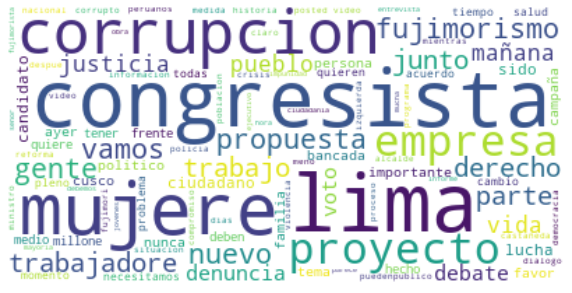

Partido:  nul (no conocido)
Tokens original: 99147
Tokens para el wordcloud: 99096
Tokens mas comunes: [('', 15294), ('vizcarra', 5059), ('lima', 4026), ('mujeres', 3284), ('gente', 3253), ('poder', 2875), ('parece', 2556), ('menos', 2530), ('justicia', 2526), ('ministro', 2505), ('dias', 2500), ('vida', 2476), ('vivo', 2450), ('personas', 2412), ('nunca', 2367), ('corrupcion', 2293), ('nuevo', 2293), ('señor', 2281), ('acuerdo', 2278), ('millones', 2277), ('claro', 2237), ('humala', 2197), ('verdad', 2172), ('pues', 2157), ('trabajo', 2136)]


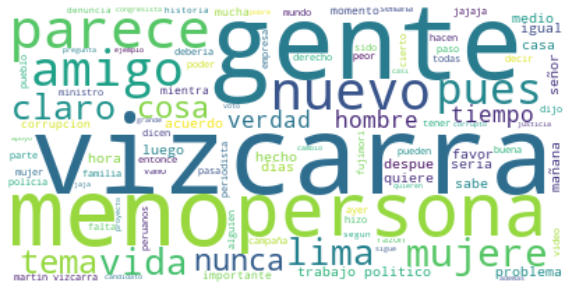

Partido:  ap (accion popular)
Tokens original: 23562
Tokens para el wordcloud: 23511
Tokens mas comunes: [('lima', 1127), ('', 707), ('accion', 489), ('muñoz', 487), ('alcalde', 447), ('jorge', 433), ('vecinos', 379), ('propuestas', 374), ('adelante', 359), ('candidato', 353), ('ciudad', 326), ('mañana', 321), ('campaña', 315), ('elecciones', 307), ('seguridad', 299), ('apoyo', 298), ('voto', 298), ('miraflores', 275), ('debate', 275), ('trabajo', 272), ('vivo', 272), ('entrevista', 265), ('muchas', 261), ('gestion', 248), ('vamos', 248)]


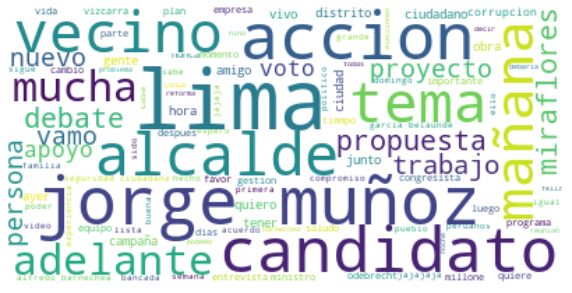

In [69]:
for partido in conjunto_partidos:     
    df=partidosdf_dict[partido]
    nombre_partido = df.nombre_partido.iloc[0]
    text = ' '.join(partidos_tweets_df_dict[partido].text_prep)
    c_tokens = Counter(text.split()) 
    print("Partido: ",partido,f"({nombre_partido})\nTokens original:",len(c_tokens))
    text = remove_common(text,common_words)
    c_tokens = Counter(text.split()) 
    print("Tokens para el wordcloud:",len(c_tokens))
    print("Tokens mas comunes:",c_tokens.most_common(25))
    muestra_wordcloud(text)

## wordclouds de #hashtags y @mentions

In [ ]:
for partido in conjunto_partidos:    
    print("Partido: ",partido)
    print("HashTags")
    muestra_wordcloud(' '.join(partidos_hashtags_dict[partido])) 
    print("Mentions")
    muestra_wordcloud(' '.join(partidos_mentions_dict[partido]))

Orientacion:  cen
HashTags


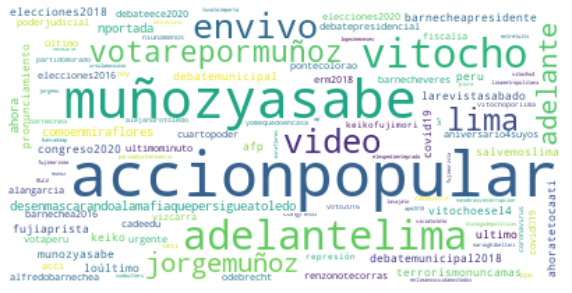

Mentions


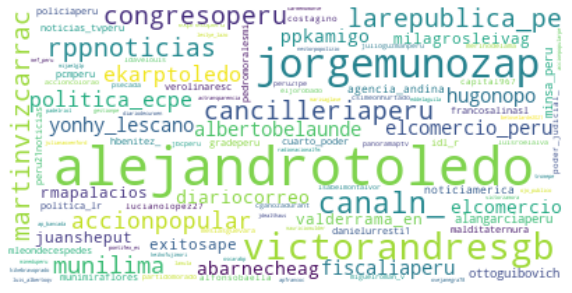

Orientacion:  cder
HashTags


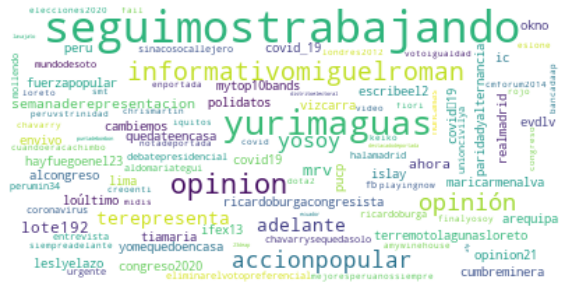

Mentions


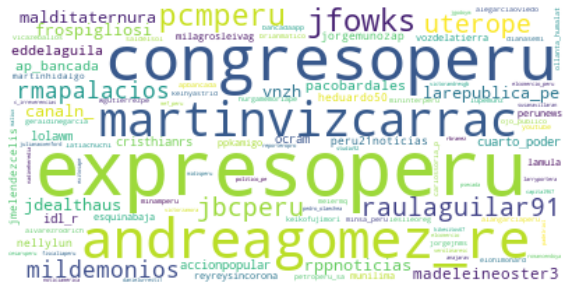

Orientacion:  izq
HashTags


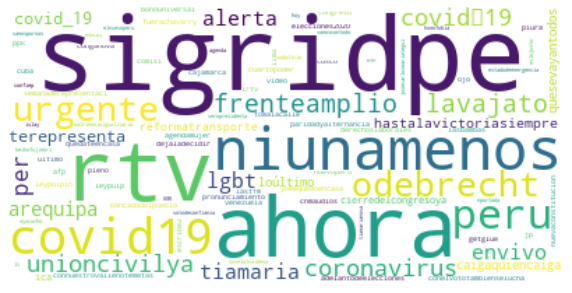

Mentions


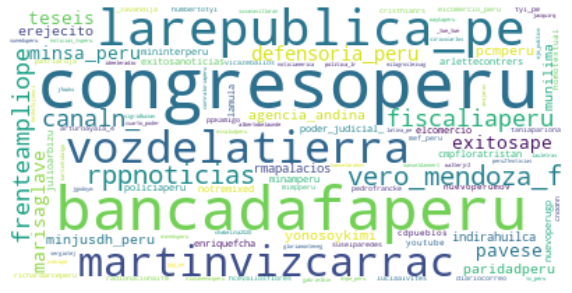

Orientacion:  cizq
HashTags


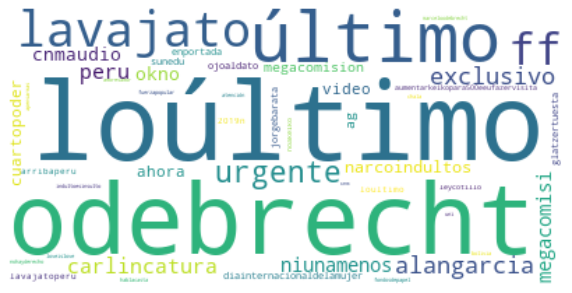

Mentions


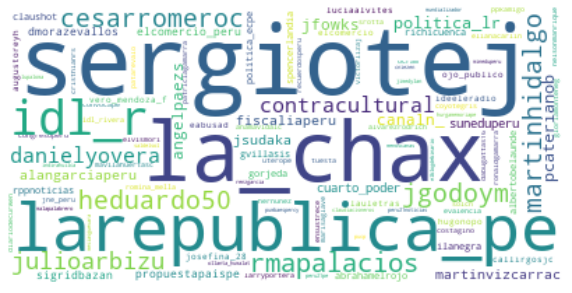

Orientacion:  der
HashTags


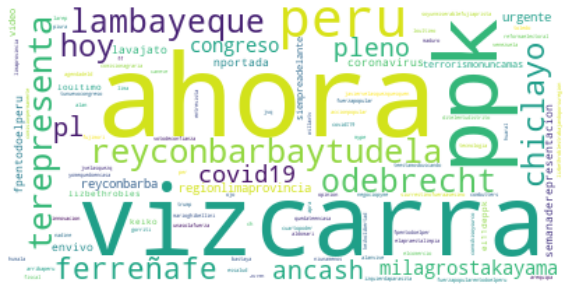

Mentions


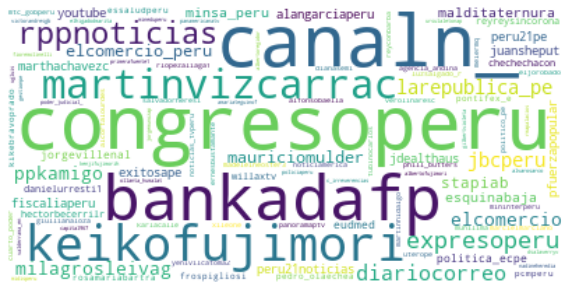

Orientacion:  nul
HashTags


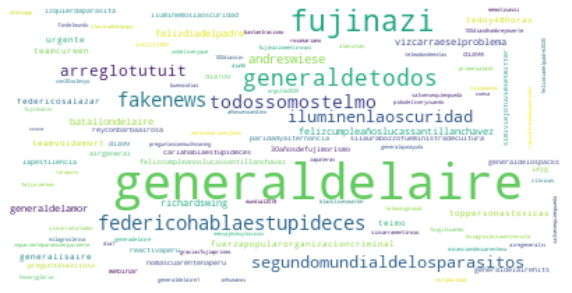

Mentions


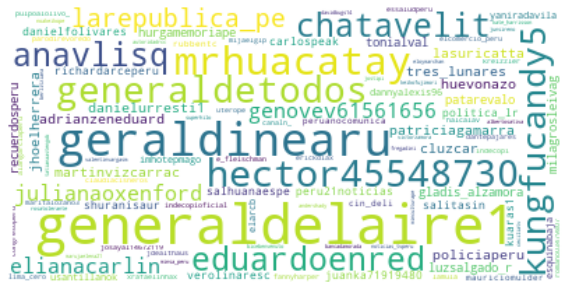

In [188]:
for orientacion in conjunto_orientacion:    
    print("Orientacion: ",orientacion)
    print("HashTags")
    muestra_wordcloud(' '.join(orientacion_hashtags_dict[orientacion])) 
    print("Mentions")
    muestra_wordcloud(' '.join(orientacion_mentions_dict[orientacion]))

In [186]:

    
c_tokens = Counter(orientacion_mentions_dict['cder'])
print(len(c_tokens))
c_tokens.most_common(35)

2534


[('@expresoperu', 522),
 ('@congresoperu', 347),
 ('@andreagomez_re', 270),
 ('@martinvizcarrac', 199),
 ('@jfowks', 175),
 ('@pcmperu', 166),
 ('@jbcperu', 118),
 ('@raulaguilar91', 112),
 ('@uterope', 108),
 ('@rmapalacios', 103),
 ('@mildemonios', 102),
 ('@malditaternura', 95),
 ('@larepublica_pe', 93),
 ('@frospigliosi', 93),
 ('@vnzh', 91),
 ('@canaln_', 90),
 ('@rppnoticias', 86),
 ('@jdealthaus', 84),
 ('@madeleineoster3', 84),
 ('@eddelaguila', 81),
 ('@pacobardales', 80),
 ('@ap_bancada', 77),
 ('@accionpopular', 74),
 ('@cuarto_poder', 69),
 ('@idl_r', 67),
 ('@cristhianrs', 67),
 ('@lolawm', 67),
 ('@ocram', 64),
 ('@peru21noticias', 62),
 ('@nellylun', 62),
 ('@heduardo50', 62),
 ('@jorgemunozap', 61),
 ('@jmelendezcelis', 61),
 ('@milagrosleivag', 58),
 ('@reyreysincorona', 58)]

In [177]:
c_tokens = Counter(orientacion_mentions_dict['izq'])
print(len(c_tokens))
c_tokens.most_common(25)

15936


[('@congresoperu', 4299),
 ('@BancadaFAperu', 3075),
 ('@larepublica_pe', 2798),
 ('@vozdelatierra', 2208),
 ('@MartinVizcarraC', 1909),
 ('@Vero_Mendoza_F', 1885),
 ('@RPPNoticias', 1806),
 ('@FiscaliaPeru', 1499),
 ('@FrenteAmplioPe', 1411),
 ('@canalN_', 1401),
 ('@Defensoria_Peru', 1207),
 ('@Minsa_Peru', 1086),
 ('@pavese', 1044),
 ('@teseis', 1033),
 ('@exitosape', 1001),
 ('@MarisaGlave', 954),
 ('@MinjusDH_Peru', 946),
 ('@Agencia_Andina', 932),
 ('@MuniLima', 891),
 ('@paridadperu', 868),
 ('@yonosoykimi', 844),
 ('@pcmperu', 818),
 ('@erejecito', 811),
 ('@rmapalacios', 808),
 ('@IndiraHuilca', 805)]

# ----------------------------------------------------------------------------

## TOPIC MODELING WITH LDA

In [220]:
all_tweets_df.text_tok

0       [harry, potter, cumple, años, hace, años, escr...
1       [2020, cambiar, logo, empresa, colores, arco, ...
2       [saboteado, votacion, dejando, debate, elimina...
3       [congresista, agradecio, organizaciones, viene...
4       [intervencion, debate, paridad, alternancia, i...
                              ...                        
3222         [mete, autogoles, cualquier, equipo, futbol]
3223                                       [correcaminos]
3224    [cuenta, fujitroll, busca, copiarse, francamen...
3225                                       [ayer, verdad]
3226    [tendencia, carla, garcia, consiguio, trabajo,...
Name: text_tok, Length: 639259, dtype: object

In [227]:
%%time
serie_tmp=all_tweets_df.text_tok
bigram = gensim.models.Phrases(serie_tmp) #, min_count=5, threshold=100)
trigram = gensim.models.Phrases(bigram[serie_tmp]) #, threshold=100)  

# Una forma más rápida de conseguir trigrama/bigrama 
bigram_mod = gensim.models.phrases.Phraser(bigram)
trigram_mod = gensim.models.phrases.Phraser(trigram)

Wall time: 1min 50s


In [228]:
orientacion='der'
serie_tmp=orientacion_tweets_df_dict[orientacion].text_prep.apply(lambda txt:txt.split())
for a in range(200):
    print(trigram_mod[serie_tmp[a]])

['alocucion', 'almirante_jorge', 'montoya', 'pocos', 'lideres', 'nacionales', 'habla', 'fuerte_claro', 'felicitaciones']
['cobarde', 'vizcarra', 'quejandose', 'exigen', 'resolver_problemas', 'vienen', 'gobiernos_pasados', 'diferencia']
['pueblo', 'decia', 'mismo', 'habia', 'escucharlo', 'cerraba', 'congreso']
['podria', 'quejarse', 'gobierno', 'totalitarios', 'destruyan', 'imagenes', 'colon', 'latinoamerica']
['especie', 'sexto', 'estilo', 'ágatha', 'dice', 'paridad_alternancia', 'desast']
['victor_zamora', 'deje', 'momento', 'pensar', 'sueldo', 'cobra', 'camarilla', 'asesores', 'izquierda']
['martin_vizcarra', 'camas', 'pasar', 'fines_junio', 'camas', 'segun', 'sala_situacional']
['marc', 'anthony', 'david', 'beckham', 'donaron', 'construccion', 'albergue', 'niños_cancer', 'peru']
['ayer', 'pdte', 'dijo', 'casi', 'gritando', 'perú', 'fracasado', 'cierto', 'sobrevive', 'gracias', 'propio', 'cuidado', 'caer']
['luego', 'meses', 'profugo', 'comunista', 'gregorio_santos', 'capturado', 'so

In [229]:
orientacion='izq'
serie_tmp=orientacion_tweets_df_dict[orientacion].text_prep.apply(lambda txt:txt.split())
for a in range(1200,1400):
    print(trigram_mod[serie_tmp[a]])

['votare', 'usted']
['pais', 'todas_sangres']
['realmente', 'gusta', 'claridad', 'simpleza', 'habla', 'muchas', 'izquierda', 'podrian']
['hecho', 'politica', 'negocio']
['ahora', 'mejor', 'debate', 'agenda_parlamentaria', '2020']
['gusto', 'escuchar', 'ojala', 'electo', 'lima']
['cochero', 'ingresar', 'congreso', 'necesitamos']
[]
['enrique_fernandez', 'debate', 'representante', 'nefasta', 'fujimontesinismo']
['enrique_fernandez', 'financiacion', 'partidos_politicos']
['retorno_bicameralidad', 'favor', 'respetar', 'dice', 'gente', 'prin']
['intervencion', 'rechaza', 'completamente', 'financiamiento', 'privados']
['bicameralidad', 'dice', 'personalmente', 'favor', 'respetar', 'voluntad_pueblo', 'expre']
['objetivo', 'empresa_privada', 'tendria', 'interes', 'colocar', 'dinero', 'partidos_politicos', 'congresistas', 'influ']
['enrique_fernandez', 'chacon', 'favor', 'bicameralidad']
['financiamiento_publico', 'solo', 'claro', 'sino', 'autentico']
['vivo', 'enrique_fernandez', 'frente_ampli

In [230]:
#serie_tmp=all_tweets_db.text_tok

dictionary = corpora.Dictionary(serie_tmp)
corpus = [dictionary.doc2bow(text) for text in  serie_tmp]

In [85]:

NUM_TOPICS = 5

ldamodel = gensim.models.ldamodel.LdaModel(corpus, num_topics = NUM_TOPICS, id2word=dictionary, passes=15)
topics = ldamodel.print_topics(num_words=9)

for topic in topics:
    print(topic)

(0, '0.014*"frente" + 0.013*"peru" + 0.012*"gracias" + 0.012*"amplio"')
(1, '0.011*"fujimori" + 0.008*"agua" + 0.008*"cada" + 0.007*"publica"')
(2, '0.009*"fujimorismo" + 0.007*"solo" + 0.007*"hace" + 0.006*"bien"')
(3, '0.009*"salud" + 0.009*"trabajadores" + 0.008*"pais" + 0.008*"derechos"')
(4, '0.017*"congreso" + 0.016*"comision" + 0.015*"congresista" + 0.009*"debe"')


In [87]:
topics = ldamodel.print_topics(num_words=9)

for topic in topics:
    print(topic)

(0, '0.014*"frente" + 0.013*"peru" + 0.012*"gracias" + 0.012*"amplio" + 0.010*"lima" + 0.007*"vamos" + 0.006*"izquierda" + 0.006*"lucha" + 0.005*"gran"')
(1, '0.011*"fujimori" + 0.008*"agua" + 0.008*"cada" + 0.007*"publica" + 0.007*"keiko" + 0.007*"arana" + 0.007*"posted" + 0.005*"region" + 0.005*"pedro"')
(2, '0.009*"fujimorismo" + 0.007*"solo" + 0.007*"hace" + 0.006*"bien" + 0.005*"puede" + 0.005*"gente" + 0.005*"millones" + 0.005*"ahora" + 0.004*"tambien"')
(3, '0.009*"salud" + 0.009*"trabajadores" + 0.008*"pais" + 0.008*"derechos" + 0.007*"peru" + 0.006*"gobierno" + 0.006*"educacion" + 0.006*"ayacucho" + 0.005*"nacional"')
(4, '0.017*"congreso" + 0.016*"comision" + 0.015*"congresista" + 0.009*"debe" + 0.008*"presidente" + 0.007*"proyecto" + 0.007*"congresistas" + 0.007*"facebook" + 0.006*"corrupcion"')


### **4. Visualización con pyLDAvis**

In [81]:
import pyLDAvis.gensim
lda_display = pyLDAvis.gensim.prepare(ldamodel, corpus, dictionary, sort_topics=False)
pyLDAvis.display(lda_display)

Año: 2008


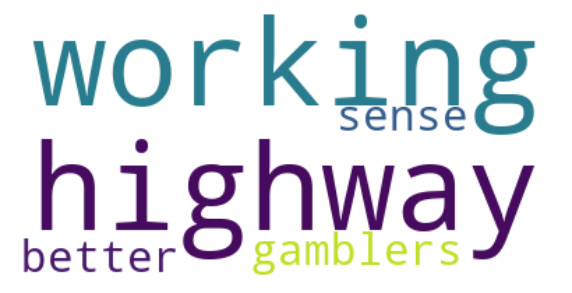

Año: 2009


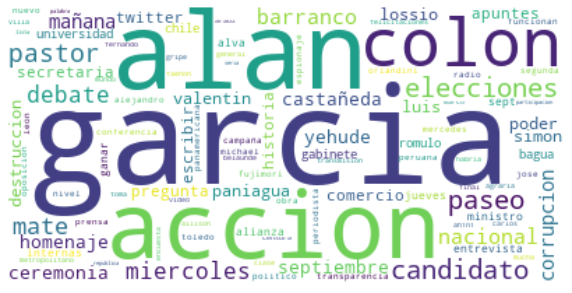

Año: 2010


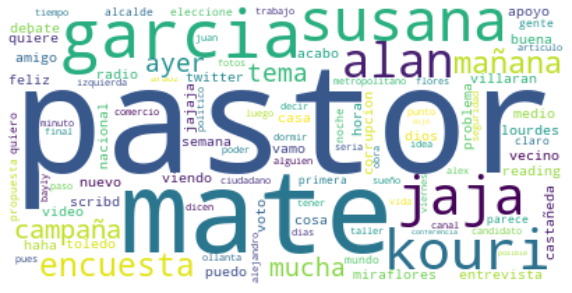

Año: 2011


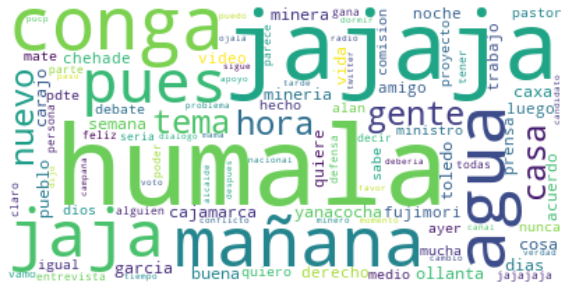

Año: 2012


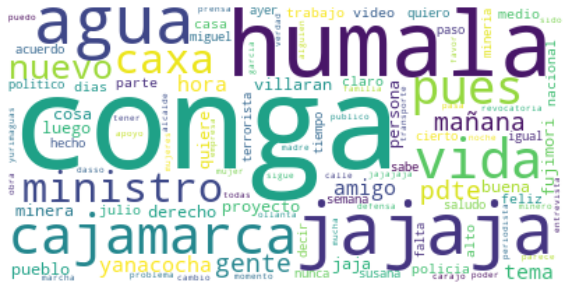

Año: 2013


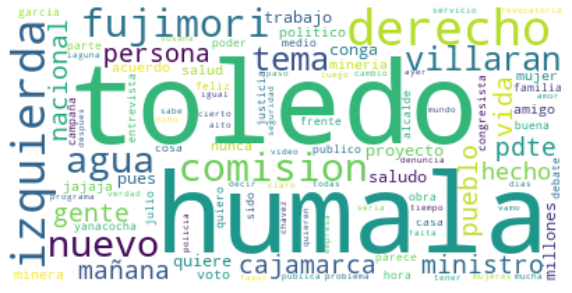

Año: 2014


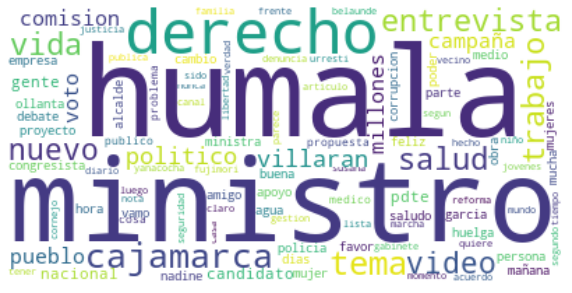

Año: 2015


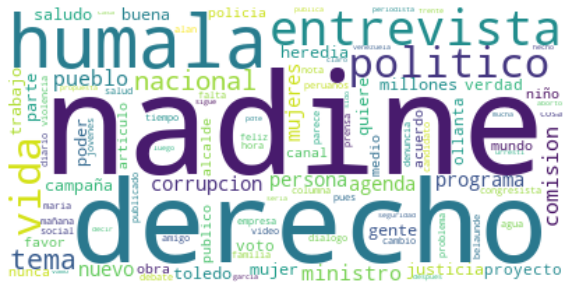

Año: 2016


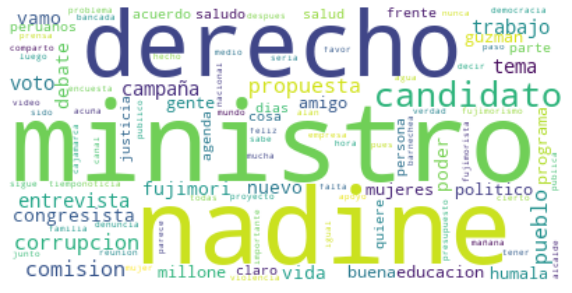

Año: 2017


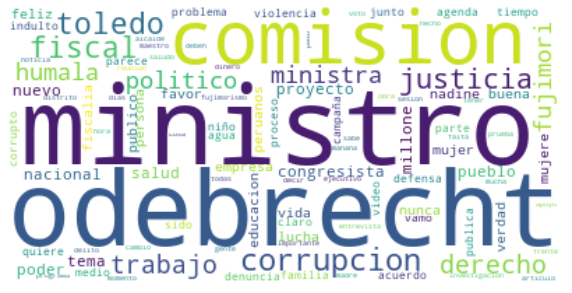

Año: 2018


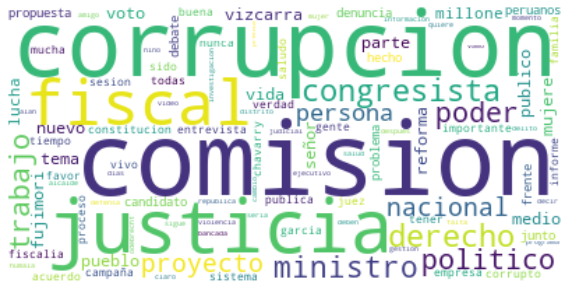

Año: 2019


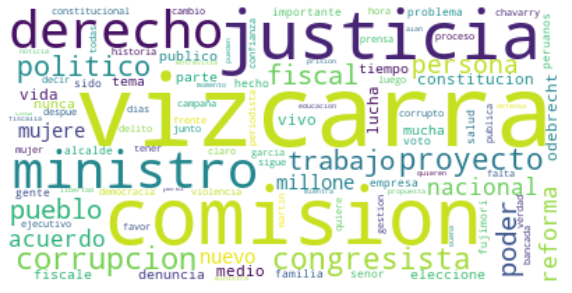

Año: 2020


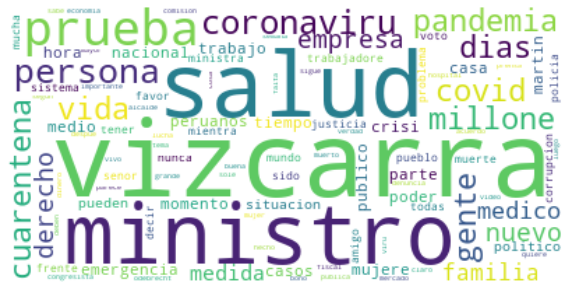

Wall time: 19.6 s


In [269]:
%%time
year_list = list(all_tweets_df.Date.str[0:4].unique())
year_list.sort()
year_tweets_df_dict = {}
for year in year_list:
    df_tmp=all_tweets_df.loc[all_tweets_df.Date.str[0:4]==year]
    #year_tweets_df_dict[year]=df.copy()
    print("Año:",year)
    muestra_wordcloud(remove_common(' '.join(df_tmp.text_prep),common_words))


In [104]:
%%time
orientacion='izq'
serie_tmp=orientacion_tweets_df_dict[orientacion].text_prep.apply(lambda txt:txt.split())
bigram = gensim.models.Phrases(serie_tmp, min_count=5, threshold=100)
trigram = gensim.models.Phrases(bigram[serie_tmp], threshold=100)  

# Una forma más rápida de conseguir trigrama/bigrama 
bigram_mod = gensim.models.phrases.Phraser(bigram)
trigram_mod = gensim.models.phrases.Phraser(trigram)

In [127]:
orientacion='der'
serie_tmp=orientacion_tweets_df_dict[orientacion].text_prep.apply(lambda txt:txt.split())
for a in range(200):
    print(bigram[serie_tmp[a]])

['alocucion', 'almirante', 'jorge', 'montoya', 'pocos', 'lideres', 'nacionales', 'habla', 'fuerte', 'claro', 'felicitaciones']
['cobarde', 'vizcarra', 'quejandose', 'exigen', 'resolver_problemas', 'vienen', 'gobiernos', 'pasados', 'diferencia']
['pueblo', 'decia', 'mismo', 'habia', 'escucharlo', 'cerraba', 'congreso']
['podria', 'quejarse', 'gobierno', 'totalitarios', 'destruyan', 'imagenes', 'colon', 'latinoamerica']
['especie', 'sexto', 'estilo', 'ágatha', 'dice', 'paridad_alternancia', 'desast']
['victor_zamora', 'deje', 'momento', 'pensar', 'sueldo', 'cobra', 'camarilla', 'asesores', 'izquierda']
['martin_vizcarra', 'camas', 'pasar', 'fines', 'junio', 'camas', 'segun', 'sala', 'situacional']
['marc', 'anthony', 'david', 'beckham', 'donaron', 'construccion', 'albergue', 'niños', 'cancer', 'peru']
['ayer', 'pdte', 'dijo', 'casi', 'gritando', 'perú', 'fracasado', 'cierto', 'sobrevive', 'gracias', 'propio', 'cuidado', 'caer']
['luego', 'meses', 'profugo', 'comunista', 'gregorio_santos'

In [ ]:
    

#c_tokens = Counter(politicotweets_all.split()) 
#print(len(c_tokens))
#c_tokens.most_common(15)
politicotweets_all = ' '.join(df_series_text_prep)
    
for idx,scr_name in enumerate(politicosdb_df['screen_name']): 
    df=politicosdf_dict[scr_name[1:]]
    print("Usuario: ",scr_name," / ",politicosdb_df['nombre'].iloc[idx]," / ",politicosdb_df['nombre_partido'].iloc[idx])
    muestra_wordcloud(df.text_prep)